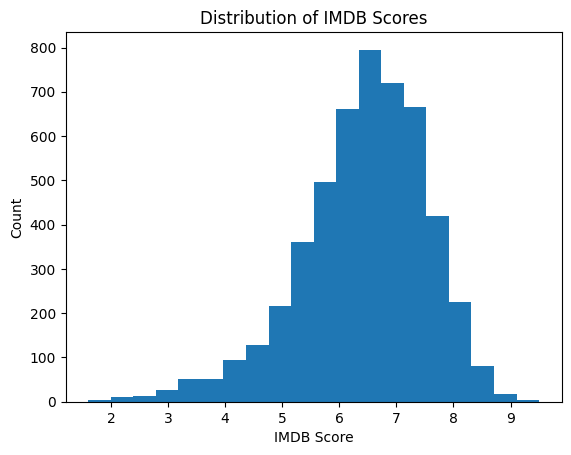

Minimum: 1.6
Maximum: 9.5
Average: 6.442344307814359
Correlation and p-value: imdb score and number of votes: 0.4569723001511038 2.236957129278473e-213
Correlation and p-value: imdb score and director_facebook_likes: 0.18551364877505772 1.826600936371876e-33
Correlation and p-value: imdb score and actor_1_facebook_likes: 0.08889305993250596 9.605547352769454e-09
Correlation and p-value: imdb score and gross: 0.1997751902842367 1.2219038408275957e-38
Correlation and p-value: imdb score and movie_facebook_likes: 0.27070782035570456 1.1875153528719764e-70
genres
Drama          2594
Comedy         1872
Thriller       1411
Action         1153
Romance        1107
Adventure       923
Crime           889
Sci-Fi          616
Fantasy         610
Horror          565
Family          546
Mystery         500
Biography       293
Animation       242
Music           214
War             213
History         207
Sport           182
Musical         132
Documentary     121
Western          97
Film-Noir     

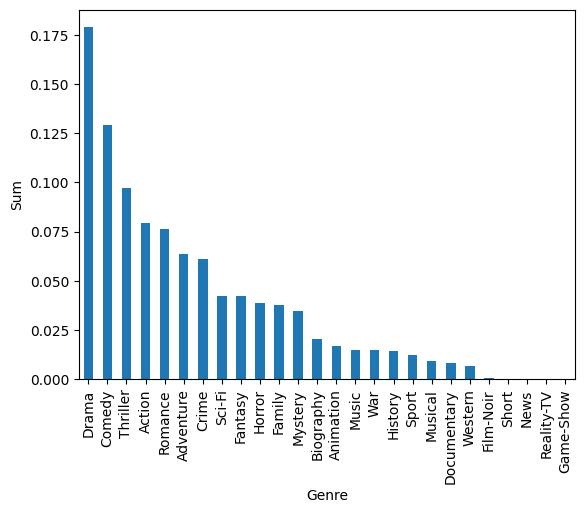

            imdb_score           movie_facebook_likes                 
                  mean       std                 mean           std   
genres                                                                
Action        6.239896  1.118835         10426.511709  23081.720324  \
Adventure     6.441170  1.131196         13219.431203  29133.603725   
Animation     6.576033  1.139595          7167.706612  14562.316546   
Biography     7.150171  0.722516         11051.034130  22849.393511   
Comedy        6.195671  1.090850          4903.568145  13463.629233   
Crime         6.564792  1.026456          6762.159730  16741.581679   
Documentary   7.180165  1.056537          2453.735537   9379.691332   
Drama         6.763763  0.957354          7696.043562  20139.843170   
Family        6.245055  1.201598          6228.432234  14270.241242   
Fantasy       6.307049  1.160686         11256.396721  20812.813236   
Film-Noir     7.633333  0.432049           194.833333    400.200158   
Game-S

C:\Users\konsta\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\konsta\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 129 (\x81) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


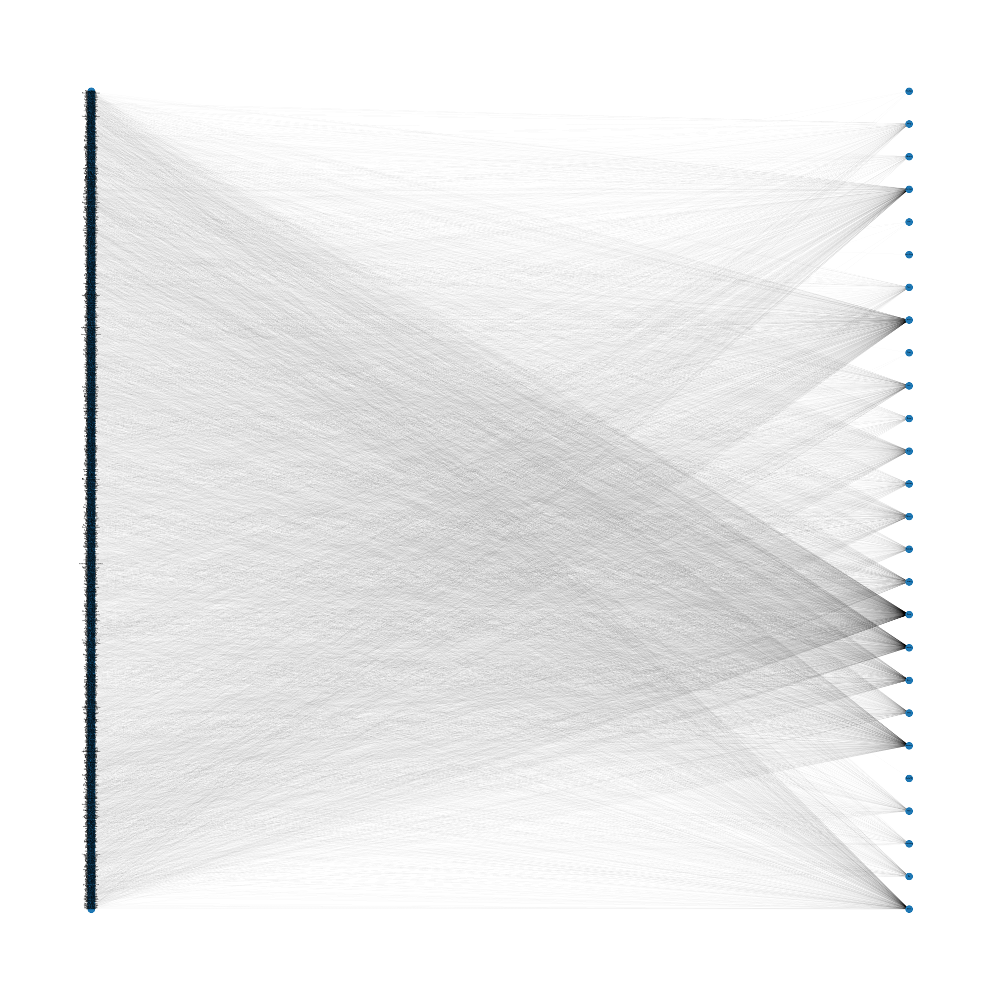

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from scipy.stats import pearsonr

# 1. 

# Read the excel file
df = pd.read_excel('MovieDatabasefix.xlsx')

# 2.

ratings = df['imdb_score']
plt.hist(ratings, bins=20)
plt.xlabel('IMDB Score')
plt.ylabel('Count')
plt.title('Distribution of IMDB Scores')
plt.show()

print('Minimum:', ratings.min())
print('Maximum:', ratings.max())
print('Average:', ratings.mean())

# 3.

dfna = df.dropna(subset=['num_voted_users', 'imdb_score', 'director_facebook_likes', 'actor_1_facebook_likes', 'gross', 'movie_facebook_likes'])
corr1, pval1 = pearsonr(dfna['imdb_score'], dfna['num_voted_users'])
corr2, pval2 = pearsonr(dfna['imdb_score'], dfna['director_facebook_likes'])
corr3, pval3 = pearsonr(dfna['imdb_score'], dfna['actor_1_facebook_likes'])
corr4, pval4 = pearsonr(dfna['imdb_score'], dfna['gross'])
corr5, pval5 = pearsonr(dfna['imdb_score'], dfna['movie_facebook_likes'])

print("Correlation and p-value: imdb score and number of votes:", corr1, pval1)
print("Correlation and p-value: imdb score and director_facebook_likes:", corr2, pval2)
print("Correlation and p-value: imdb score and actor_1_facebook_likes:", corr3, pval3)
print("Correlation and p-value: imdb score and gross:", corr4, pval4)
print("Correlation and p-value: imdb score and movie_facebook_likes:", corr5, pval5)


# 4.

genres = df["genres"]
df_genres = df.assign(genres=df.genres.str.split("|")).explode("genres")
print(df_genres["genres"].value_counts())
genre_counts = df_genres["genres"].value_counts()

#calculating proportions
genre_a = genre_counts / genre_counts.sum()

#plot proportions
genre_a.plot(kind="bar")
plt.xlabel("Genre")
plt.ylabel("Sum")
plt.show()

grouped_genres = df_genres.groupby("genres")
df_summary = grouped_genres[["imdb_score", "movie_facebook_likes", "director_facebook_likes"]].agg(["mean", "std"])
print(df_summary)

# 5.

genrelist = df["genres"].str.split("|").explode().unique()
genreamounts = pd.DataFrame(0,index=df['director_name'].drop_duplicates(), columns=genrelist)

for i, row in df.iterrows():
    for genre in row['genres'].split("|"):
        genreamounts.at[row['director_name'],genre] +=1

G = nx.Graph()
for i, row in df.iterrows():
    for genre in row['genres'].split("|"):
        G.add_edge(row['director_name'], genre)
plt.figure(3,figsize=(20,20))
nx.draw(G, with_labels = True, font_size = 2, node_size = 100, pos=nx.bipartite_layout(G, df['director_name'].drop_duplicates()), width=0.01)
plt.show()

# 6.

# Read the CSV file and select the required columns
data = pd.read_excel('MovieDatabasefix.xlsx')
directors_genres = data[['director_name', 'genres']]

# Group the data by director and genre, and count the number of movies in each group
grouped_data = directors_genres.groupby(['director_name', 'genres']).size().reset_index(name='count')

# Create an empty weighted graph
G = nx.Graph()

# Add nodes for each director
directors = grouped_data['director_name'].unique()
for director in directors:
    G.add_node(director)

# Add edges between directors who produced the same genre of movies
for genre in grouped_data['genres'].unique():
    genre_data = grouped_data[grouped_data['genres'] == genre]
    for i in range(len(genre_data)):
        for j in range(i+1, len(genre_data)):
            director1 = genre_data.iloc[i]['director_name']
            director2 = genre_data.iloc[j]['director_name']
            weight = genre_data.iloc[i]['count'] * genre_data.iloc[j]['count']
            G.add_edge(director1, director2, weight=weight)


C:\Users\konsta\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\konsta\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 129 (\x81) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


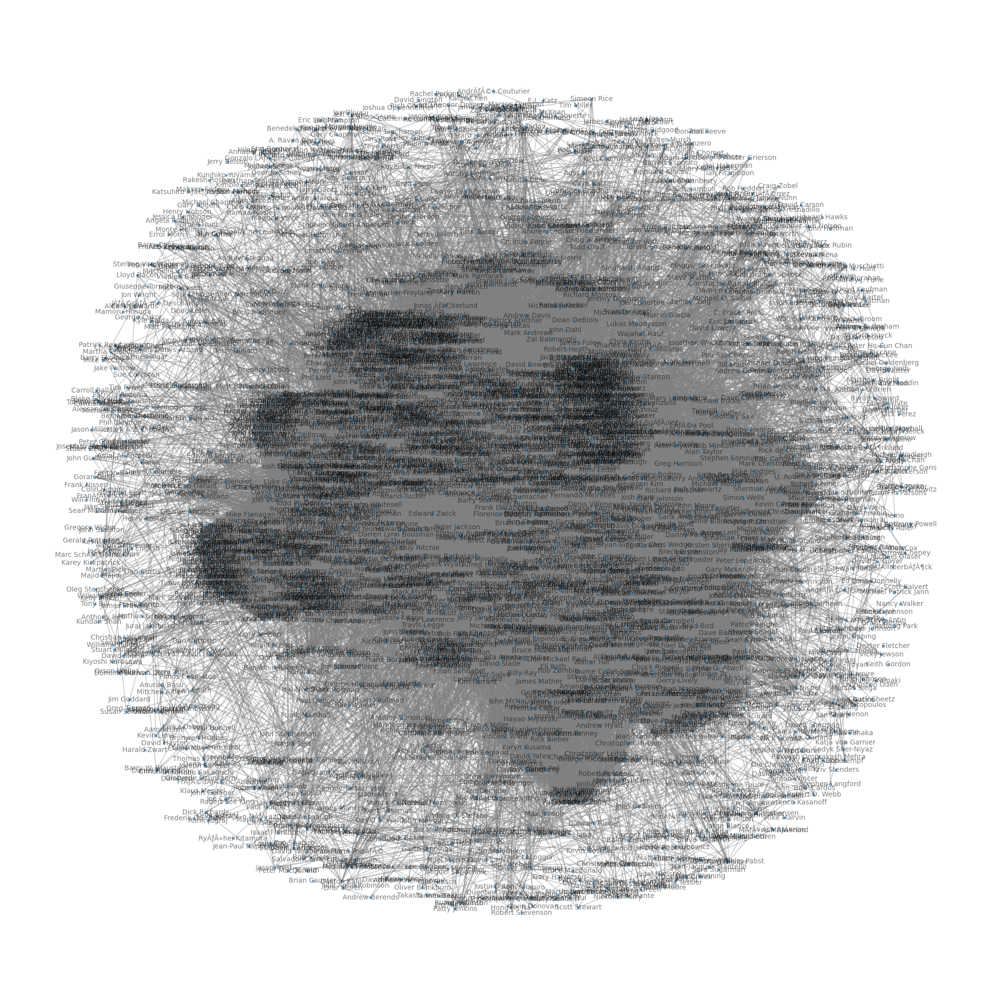

In [42]:
# draw the social network graph
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G, k=0.5, iterations=50)
nx.draw(G, pos, node_size=10, edge_color='grey', alpha=0.5, with_labels=True, font_size=10)
plt.show()

In [43]:

# save the adjacency matrix to an excel file
df_adj = nx.to_pandas_adjacency(G)
print(df_adj)
df_adj.to_excel("adjacency_matrix.xlsx")

                       A. Raven Cruz  Aaron Hann  Aaron Schneider   
A. Raven Cruz                    0.0         0.0              0.0  \
Aaron Hann                       0.0         0.0              0.0   
Aaron Schneider                  0.0         0.0              0.0   
Aaron Seltzer                    0.0         0.0              0.0   
Abel Ferrara                     0.0         0.0              0.0   
...                              ...         ...              ...   
Zoran Lisinac                    0.0         0.0              0.0   
ÃƒÂlex de la Iglesia            0.0         0.0              0.0   
Ãƒâ€°mile Gaudreault             0.0         0.0              0.0   
Ãƒâ€°ric Tessier                 0.0         0.0              0.0   
Ãƒâ€°tienne Faure                0.0         0.0              0.0   

                       Aaron Seltzer  Abel Ferrara  Adam Brooks  Adam Carolla   
A. Raven Cruz                    0.0           0.0          0.0           0.0  \
Aaron Han

In [44]:
# 7.

bc = nx.betweenness_centrality(G)
bcn = max(bc, key=bc.get)
print(bcn) # Steven Spielberg

dc = nx.degree_centrality(G)
dcn = max(dc, key=dc.get)
print(dcn) # Woody Allen

cc = nx.closeness_centrality(G)
ccn = max(cc, key=cc.get)
print(ccn) # Woody Allen

eigenvalue = max(nx.adjacency_spectrum(G))
kc = nx.katz_centrality_numpy(G, alpha=(1/eigenvalue.real)-0.00001, weight='weight')
kcn = max(kc, key=kc.get)
print(kcn) # Woody Allen

Steven Spielberg
Woody Allen
Woody Allen
Woody Allen


Number of all found communities: 275
Number of disconnected communities: 5
Number of remaining communities: 270


C:\Users\konsta\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\konsta\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 129 (\x81) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


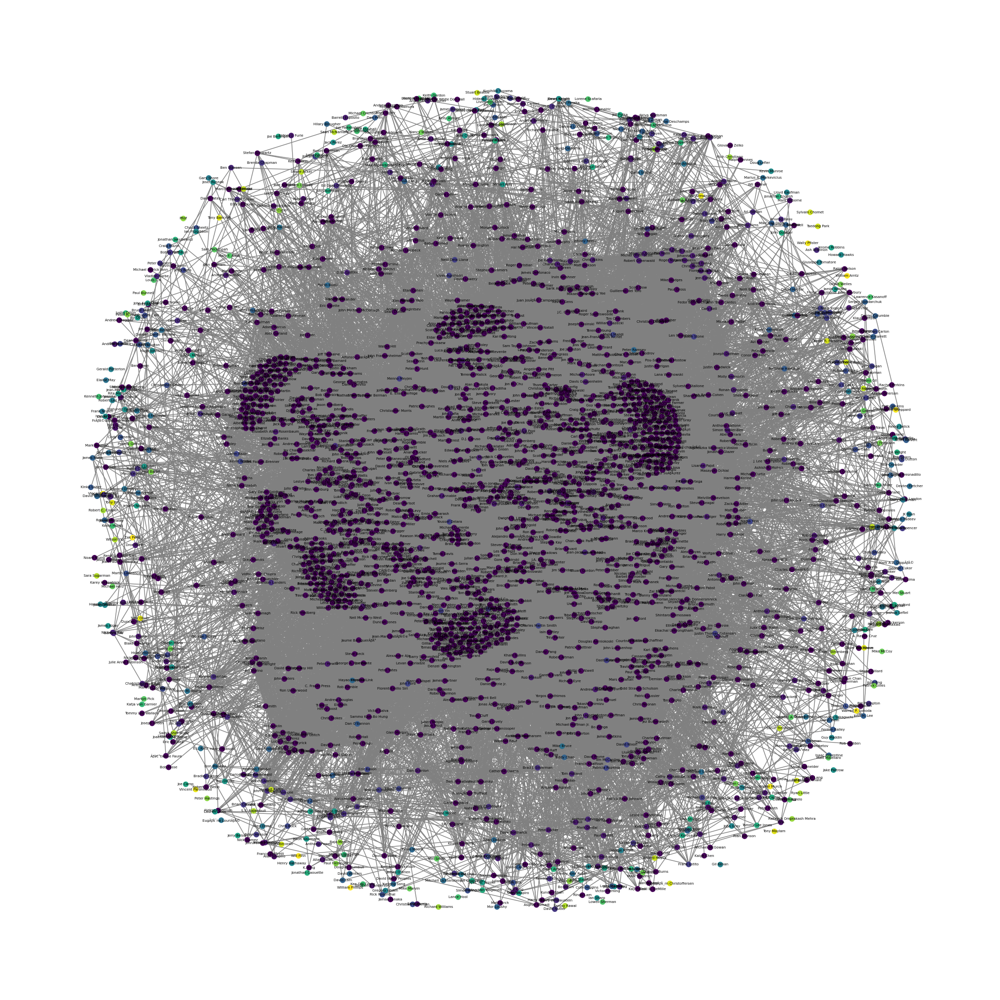

    Community Number of Nodes Number of Edges Diameter Average Path Length   
0           0               1               0        0                   0  \
1           1               2               1        1                 1.0   
2           2            1116           78652        5            2.081669   
3           3             592           12571        5            2.270316   
4           4              16              94        2            1.216667   
..        ...             ...             ...      ...                 ...   
265       265               1               0        0                   0   
266       266               1               0        0                   0   
267       267               1               0        0                   0   
268       268               1               0        0                   0   
269       269               1               0        0                   0   

    Average Degree  
0              0.0  
1              1.0  


In [45]:
# 8. Use label propagation instead of Girvan-Newman
# get the communities using label propagation
communities = list(nx.algorithms.community.label_propagation_communities(G))

# copy the graph
G2 = G.copy()

# filter out disconnected communities
print("Number of all found communities:", len(communities))
disconnected_communities = []
for community in communities:
    if not nx.is_connected(G.subgraph(community)):
        disconnected_communities.append(community)
        communities.remove(community)
        for node in community:
            G2.remove_node(node)

print("Number of disconnected communities:", len(disconnected_communities))
print("Number of remaining communities:", len(communities))

# assign a color to each community
colors = {}
for i, community in enumerate(communities):
    for node in community:
        colors[node] = i

# draw the graph with the community colors
pos = nx.spring_layout(G2, k=0.5, iterations=50)
plt.figure(figsize=(20, 20))
nx.draw(G2, pos, node_color=[colors[node] for node in G2.nodes()], with_labels=True, node_size=50, edge_color='grey', alpha=1, font_size=5)
plt.show()


# create a table to summarize key characteristics of each community
df_summary = pd.DataFrame(columns=['Community', 'Number of Nodes', 'Number of Edges', 'Diameter', 'Average Path Length', 'Average Degree'])

# calculate number of nodes and edges in each community
for i in range(len(communities)):
    community = communities[i]
    subgraph = G.subgraph(community)
    df_summary.loc[i, 'Community'] = i
    df_summary.loc[i, 'Number of Nodes'] = len(subgraph.nodes())
    df_summary.loc[i, 'Number of Edges'] = len(subgraph.edges())

# calculate diameter, average path length, and average degree of each community
for i in range(len(communities)):
    community = communities[i]
    subgraph = G.subgraph(community)
    df_summary.loc[i, 'Diameter'] = nx.diameter(subgraph)
    df_summary.loc[i, 'Average Path Length'] = nx.average_shortest_path_length(subgraph)
    df_summary.loc[i, 'Average Degree'] = sum(dict(subgraph.degree()).values())/len(subgraph.nodes())

print(df_summary)

In [46]:

# find most valuable node in largest community
largest_community = max(communities, key=len)
largest_subgraph = G.subgraph(largest_community)
largest_degree = dict(largest_subgraph.degree())
most_valuable_node = max(largest_degree, key=largest_degree.get)
print("Most valuable node in largest community:", most_valuable_node)


Most valuable node in largest community: Woody Allen


In [48]:
# save the summary table to an excel file
df_summary.to_excel("communities.xlsx")